# Transferring Image Styles

This notebook provides you with a complete code example that loads the content image, the style image, and the VGG16 pre-trained neural network, and uses them to transfer the style to the image.


## Loading the Content and Style Images

Load a crop of the content image ...

This image is sourced from the Drosophila ssTEM dataset, which is publicly available on Figshare: [Segmented anisotropic ssTEM dataset of neural tissue](https://figshare.com/articles/dataset/Segmented_anisotropic_ssTEM_dataset_of_neural_tissue/856713). This dataset provides a detailed view of neural tissue, aiding in the study of neural structures and patterns. The image can also be downloaded from the corresponding GitHub repository at [this link](http://github.com/unidesigner/groundtruth-drosophila-vnc), which offers additional resources and information related to the Drosophila ssTEM dataset.


In [1]:
from PIL import Image

content = (
    Image.open("neuraltissue_with_colorlabels.png")
    .convert("RGB")
    .crop((100, 170, 100 + 256, 170 + 256)) 
)

... plot it ...


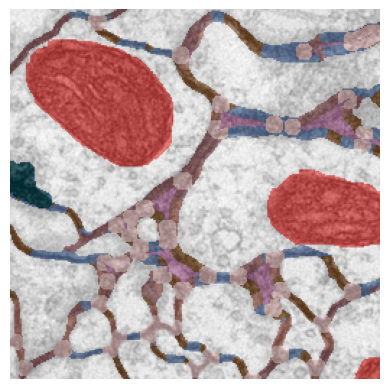

In [2]:
import matplotlib.pyplot as plt

plt.imshow(content)
plt.axis("off")
plt.show()

... load the style image ...

You'll use the style of the _trencadis_ lizard by Antoni Gaudi in Parc Guell (Barcelona).


In [3]:
style = Image.open("lizard.png").convert("RGB").resize((256, 256))

... and plot it.


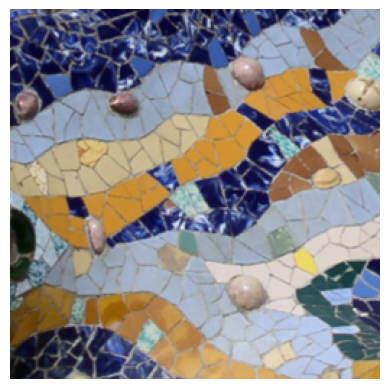

In [4]:
plt.imshow(style)
plt.axis("off")
plt.show()

## Loading a Pre-Trained Neural Network


In [5]:
from torchvision.models import vgg16, VGG16_Weights

model = vgg16(weights=VGG16_Weights.IMAGENET1K_V1)
model.eval()
model.requires_grad_(False)

print(model)

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [6]:
import numpy as np
import torch

mean = np.array([0.485, 0.456, 0.406], dtype=np.float32)
std = np.array([0.229, 0.224, 0.225], dtype=np.float32)

low = torch.tensor((- mean / std).reshape(1, -1, 1, 1))
high = torch.tensor(((1 - mean) / std).reshape(1, -1, 1, 1))

## Implementing Style Transfer

Implement a function to calculate the Gram matrix between all the activations of a specific layer ...


In [7]:
from torch import bmm

def gram(tensor):
    """Gram matrix."""
    batch_size, num_channels, height, width = tensor.size()
    features = tensor.view(batch_size, num_channels, height * width)
    gram_matrix = bmm(features, features.transpose(1, 2)) / (height * width)
    return gram_matrix

... define functions to to convert an image to a tensor, and vice versa ...


In [8]:
import torchvision.transforms as tt

def image_to_tensor(im, mean, std):
    """Convert image to tensor."""
    normalize = tt.Compose([tt.ToTensor(), tt.Normalize(mean, std)]) 
    return normalize(im).unsqueeze(0).requires_grad_(True)

def tensor_to_image(image, mean, std):
    """Convert tensor to image."""
    denormalize = tt.Normalize(mean=- mean / std, std=1 / std)
    im_array = denormalize(image.data.clone().detach().squeeze()).numpy() 
    im_array = np.clip(im_array.transpose(1, 2, 0) * 255, 0, 255)
    im_array = im_array.astype(np.uint8)
    return Image.fromarray(im_array, "RGB")

... define a context manager class ...


In [9]:
class Fwd_Hooks():
    """Forward hook."""
    
    def __init__(self, layers):
        """Initialize forward hooks."""
        self.hooks = []
        self.activations_list = []
        for layer in layers:
            self.hooks.append(layer.register_forward_hook(self.hook_func))
    
    def hook_func(self, layer, input, output):
        """Save activations."""
        self.activations_list.append(output)

    def __enter__(self, *args):
        """Enter context and register hooks."""
        return self

    def __exit__(self, *args):
        """Exit context management and remove hooks."""
        for hook in self.hooks:
            hook.remove()

... and define a function to implement style transfer.


In [10]:
def style_transfer(image, content, style, content_layers, style_layers,
                   lr=1, iter_num=100, beta=1e3):
    """Perform style transfer."""
    mean = np.array([0.485, 0.456, 0.406], dtype=np.float32)
    std = np.array([0.229, 0.224, 0.225], dtype=np.float32)
    
    image_tensor = image_to_tensor(image, mean, std)
    
    with Fwd_Hooks(content_layers) as fh:
        _ = model(image_to_tensor(content, mean, std))
    content_activations = [activations.detach()
                           for activations in fh.activations_list]
    
    with Fwd_Hooks(style_layers) as fh:
        _ = model(image_to_tensor(style, mean, std))
    gram_targets = [gram(activations.detach())
                    for activations in fh.activations_list]

    optimizer = torch.optim.LBFGS([image_tensor], lr=lr) 
    mse_loss = torch.nn.MSELoss(reduction="sum")

    def closure():
        """Closure function for the optimizer.""" 
        optimizer.zero_grad()
        
        with Fwd_Hooks(content_layers) as fh:
            _ = model(image_tensor)
        image_content_activations = fh.activations_list
        
        content_loss = 0
        for ia, ca in zip(image_content_activations, content_activations):
            n_f = ia.shape[1]
            content_loss += mse_loss(ia, ca) / n_f ** 2
        content_loss /= len(image_content_activations)
        
        with Fwd_Hooks(style_layers) as fh:
            _ = model(image_tensor)
        gram_image = [gram(activations) for activations in fh.activations_list]

        style_loss = 0
        for gi, gt in zip(gram_image, gram_targets):
            n_g = gi.shape[1]
            style_loss += mse_loss(gi, gt) / n_g ** 2
        style_loss /= len(gram_image) 
        
        print(f"content_loss={content_loss} style_loss={style_loss}")

        total_loss = content_loss + beta * style_loss
        total_loss.backward()        
        return total_loss
    
    for i in range(iter_num):
        print(f"iteration {i}")
        optimizer.step(closure)
        
        image = tensor_to_image(image_tensor, mean, std)

        if i <= 5 or i % 10 == 0 or i == iter_num - 1:
            plt.imshow(image)
            plt.title(f"Iteration {i}")
            plt.axis("off")
            plt.show()
    
    return image

## Transferring the Style of an Image to Another Image

Starting from a random image ...


iteration 0
content_loss=331.43487548828125 style_loss=223.11770629882812
content_loss=331.43292236328125 style_loss=223.10330200195312
content_loss=300.3465881347656 style_loss=66.1177978515625
content_loss=288.22137451171875 style_loss=41.17158889770508
content_loss=273.5025634765625 style_loss=19.551616668701172
content_loss=266.569091796875 style_loss=10.363984107971191
content_loss=267.86407470703125 style_loss=5.94489049911499
content_loss=286.228271484375 style_loss=3.7004904747009277
content_loss=327.5147705078125 style_loss=2.3525679111480713
content_loss=352.4849853515625 style_loss=1.6682872772216797
content_loss=352.63336181640625 style_loss=1.2574750185012817
content_loss=365.8921813964844 style_loss=0.9862720370292664
content_loss=341.82098388671875 style_loss=0.8681432604789734
content_loss=350.5566101074219 style_loss=0.7274301052093506
content_loss=353.7899169921875 style_loss=0.6401926875114441
content_loss=342.8977355957031 style_loss=0.5763798356056213
content_loss=

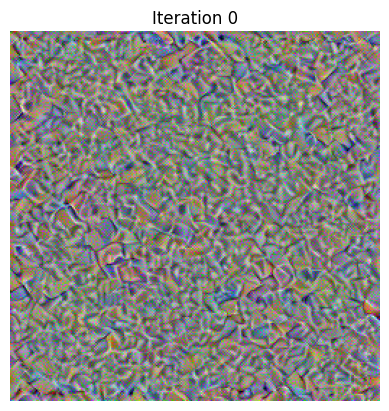

iteration 1
content_loss=326.2188720703125 style_loss=0.3420368432998657
content_loss=325.4197692871094 style_loss=0.31125056743621826
content_loss=324.04510498046875 style_loss=0.28711992502212524
content_loss=316.3302001953125 style_loss=0.27434805035591125
content_loss=315.49853515625 style_loss=0.25376033782958984
content_loss=314.5010070800781 style_loss=0.23721802234649658
content_loss=307.1773681640625 style_loss=0.22839348018169403
content_loss=305.9914855957031 style_loss=0.21314387023448944
content_loss=303.0467529296875 style_loss=0.20402579009532928
content_loss=298.3153991699219 style_loss=0.19047220051288605
content_loss=295.3620910644531 style_loss=0.1776188164949417
content_loss=285.44610595703125 style_loss=0.18693017959594727
content_loss=289.24114990234375 style_loss=0.16745801270008087
content_loss=288.21746826171875 style_loss=0.1621462106704712
content_loss=282.7732238769531 style_loss=0.1584656536579132
content_loss=279.54254150390625 style_loss=0.151195198297500

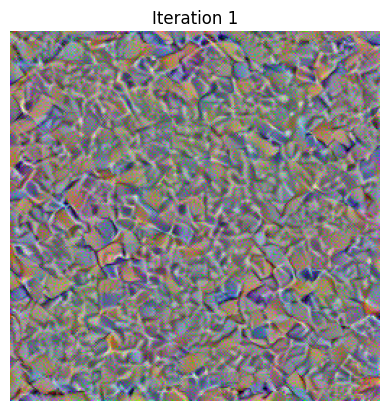

iteration 2
content_loss=263.5478820800781 style_loss=0.13154801726341248
content_loss=263.0906982421875 style_loss=0.1239280104637146
content_loss=261.3662109375 style_loss=0.12148533016443253
content_loss=257.92169189453125 style_loss=0.11774017661809921
content_loss=256.4273986816406 style_loss=0.11329817771911621
content_loss=251.31912231445312 style_loss=0.1149364486336708
content_loss=249.596923828125 style_loss=0.11054329574108124
content_loss=248.85757446289062 style_loss=0.1063331589102745
content_loss=243.42453002929688 style_loss=0.10739133507013321
content_loss=243.5536651611328 style_loss=0.10099928081035614
content_loss=240.9672088623047 style_loss=0.10090150684118271
content_loss=238.77264404296875 style_loss=0.09869717061519623
content_loss=234.68482971191406 style_loss=0.09786640107631683
content_loss=233.81375122070312 style_loss=0.0936727374792099
content_loss=230.76626586914062 style_loss=0.09308530390262604
content_loss=228.1622772216797 style_loss=0.09099109470844

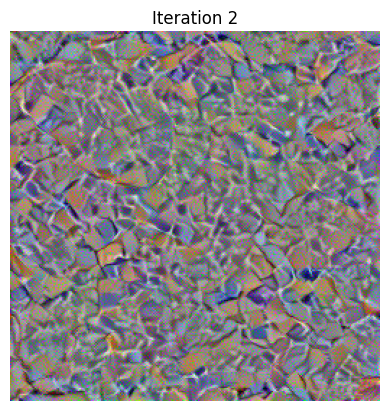

iteration 3
content_loss=217.2477264404297 style_loss=0.08324702829122543
content_loss=215.93580627441406 style_loss=0.08206857740879059
content_loss=214.12640380859375 style_loss=0.08036260306835175
content_loss=212.0785675048828 style_loss=0.0783182755112648
content_loss=210.17398071289062 style_loss=0.07659191638231277
content_loss=206.68325805664062 style_loss=0.07669878005981445
content_loss=206.23245239257812 style_loss=0.0740293636918068
content_loss=204.5282440185547 style_loss=0.07371938228607178
content_loss=202.05943298339844 style_loss=0.07314988225698471
content_loss=200.79251098632812 style_loss=0.07164738327264786
content_loss=199.11273193359375 style_loss=0.07046717405319214
content_loss=196.36866760253906 style_loss=0.07019805163145065
content_loss=195.67103576660156 style_loss=0.06905510276556015
content_loss=195.09185791015625 style_loss=0.06714363396167755
content_loss=192.70083618164062 style_loss=0.06854049116373062
content_loss=192.59901428222656 style_loss=0.067

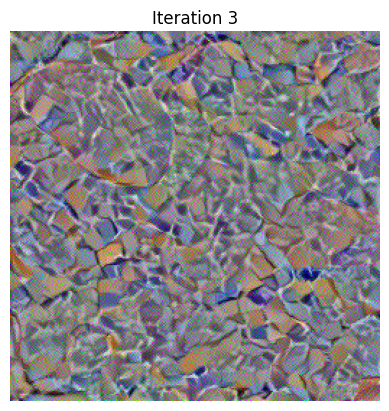

iteration 4
content_loss=184.82015991210938 style_loss=0.0633343905210495
content_loss=184.00344848632812 style_loss=0.06194857507944107
content_loss=182.0582733154297 style_loss=0.06217576190829277
content_loss=181.01022338867188 style_loss=0.06108247488737106
content_loss=179.58465576171875 style_loss=0.06054586172103882
content_loss=178.6236572265625 style_loss=0.059613488614559174
content_loss=176.57241821289062 style_loss=0.059970952570438385
content_loss=176.08731079101562 style_loss=0.05851592868566513
content_loss=174.8543243408203 style_loss=0.05819110944867134
content_loss=172.86502075195312 style_loss=0.05802362412214279
content_loss=172.513427734375 style_loss=0.0565653070807457
content_loss=170.48519897460938 style_loss=0.056952137500047684
content_loss=169.1756591796875 style_loss=0.05608481168746948
content_loss=168.44688415527344 style_loss=0.05508468300104141
content_loss=166.1173553466797 style_loss=0.05705486610531807
content_loss=166.81753540039062 style_loss=0.0546

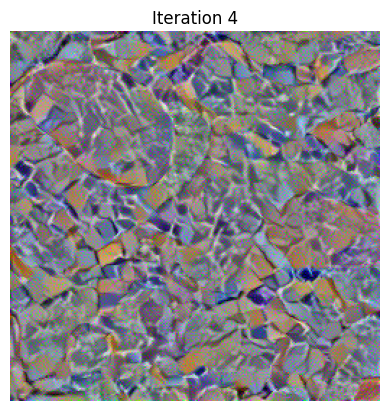

iteration 5
content_loss=161.70501708984375 style_loss=0.05280206725001335
content_loss=160.3865966796875 style_loss=0.05248255655169487
content_loss=159.3411407470703 style_loss=0.05182391405105591
content_loss=157.8511505126953 style_loss=0.05170802026987076
content_loss=157.24273681640625 style_loss=0.05083920806646347
content_loss=156.0218963623047 style_loss=0.05102226138114929
content_loss=155.24542236328125 style_loss=0.05040935426950455
content_loss=153.69503784179688 style_loss=0.05082043260335922
content_loss=153.75030517578125 style_loss=0.049442749470472336
content_loss=152.71458435058594 style_loss=0.04929547756910324
content_loss=151.4049835205078 style_loss=0.04920012503862381
content_loss=150.8065948486328 style_loss=0.048431333154439926
content_loss=149.67103576660156 style_loss=0.048240143805742264
content_loss=148.78890991210938 style_loss=0.04775703698396683
content_loss=147.808837890625 style_loss=0.04753502085804939
content_loss=146.74415588378906 style_loss=0.047

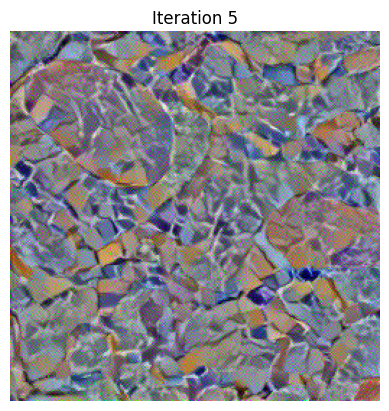

iteration 6
content_loss=142.08877563476562 style_loss=0.04661941155791283
content_loss=141.9507598876953 style_loss=0.04553774744272232
content_loss=141.55325317382812 style_loss=0.04508283734321594
content_loss=140.15090942382812 style_loss=0.04545488953590393
content_loss=140.0675048828125 style_loss=0.04456951469182968
content_loss=139.58267211914062 style_loss=0.044411469250917435
content_loss=138.0509490966797 style_loss=0.044853366911411285
content_loss=138.25958251953125 style_loss=0.043743204325437546
content_loss=137.6719970703125 style_loss=0.04380587488412857
content_loss=136.30767822265625 style_loss=0.04440294951200485
content_loss=136.45069885253906 style_loss=0.04335172101855278
content_loss=135.95315551757812 style_loss=0.04321293160319328
content_loss=134.67344665527344 style_loss=0.043590448796749115
content_loss=134.7183837890625 style_loss=0.04268036410212517
content_loss=134.44448852539062 style_loss=0.04249047860503197
content_loss=133.38975524902344 style_loss=0

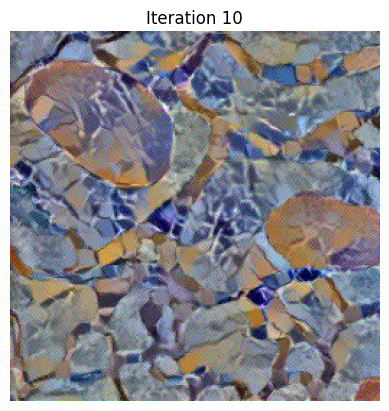

iteration 11
content_loss=101.27555847167969 style_loss=0.031838852912187576
content_loss=101.15192413330078 style_loss=0.03166098892688751
content_loss=100.87413024902344 style_loss=0.03165292739868164
content_loss=100.72562408447266 style_loss=0.03150155022740364
content_loss=100.4809341430664 style_loss=0.0314645990729332
content_loss=100.31773376464844 style_loss=0.03133746236562729
content_loss=100.01677703857422 style_loss=0.03135349228978157
content_loss=99.9574203491211 style_loss=0.03113529644906521
content_loss=99.57975769042969 style_loss=0.03125041723251343
content_loss=99.57730865478516 style_loss=0.030986106023192406
content_loss=99.21337127685547 style_loss=0.031092042103409767
content_loss=99.09390258789062 style_loss=0.030939573422074318
content_loss=98.86846160888672 style_loss=0.030919481068849564
content_loss=98.6769027709961 style_loss=0.03085004910826683
content_loss=98.5113296508789 style_loss=0.03076520562171936
content_loss=98.33879089355469 style_loss=0.030684

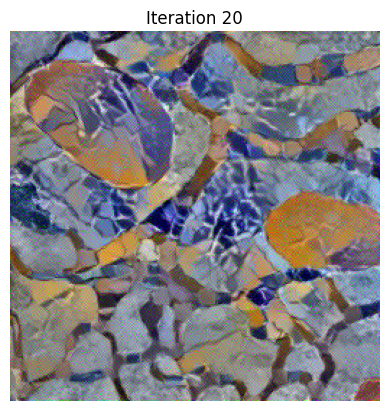

iteration 21
content_loss=80.59098815917969 style_loss=0.025271186605095863
content_loss=80.57943725585938 style_loss=0.02521415986120701
content_loss=80.51252746582031 style_loss=0.025217631831765175
content_loss=80.47486114501953 style_loss=0.025190245360136032
content_loss=80.41886138916016 style_loss=0.025181379169225693
content_loss=80.38043212890625 style_loss=0.0251569002866745
content_loss=80.31495666503906 style_loss=0.025158843025565147
content_loss=80.27669525146484 style_loss=0.025132114067673683
content_loss=80.1801528930664 style_loss=0.025165965780615807
content_loss=80.17819213867188 style_loss=0.02510569617152214
content_loss=80.0959701538086 style_loss=0.025128740817308426
content_loss=80.07962799072266 style_loss=0.025084227323532104
content_loss=80.01445007324219 style_loss=0.025088798254728317
content_loss=79.96209716796875 style_loss=0.025080543011426926
content_loss=79.90872955322266 style_loss=0.025074884295463562
content_loss=79.86572265625 style_loss=0.0250564

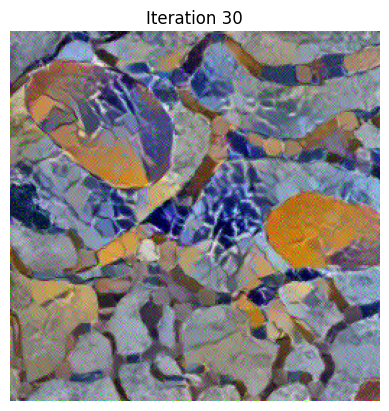

iteration 31
content_loss=74.02325439453125 style_loss=0.023492952808737755
content_loss=73.99452209472656 style_loss=0.023496082052588463
content_loss=73.98696899414062 style_loss=0.023479197174310684
content_loss=73.95037078857422 style_loss=0.02349151112139225
content_loss=73.94686889648438 style_loss=0.02347003109753132
content_loss=73.90804290771484 style_loss=0.0234833937138319
content_loss=73.90340423583984 style_loss=0.02346133440732956
content_loss=73.86885833740234 style_loss=0.023469800129532814
content_loss=73.85366821289062 style_loss=0.023458918556571007
content_loss=73.8294677734375 style_loss=0.023457437753677368
content_loss=73.80934143066406 style_loss=0.023452028632164
content_loss=73.79512023925781 style_loss=0.023440832272171974
content_loss=73.76593017578125 style_loss=0.02344527468085289
content_loss=73.75721740722656 style_loss=0.02342905104160309
content_loss=73.71951293945312 style_loss=0.02344215288758278
content_loss=73.7125473022461 style_loss=0.02342442981

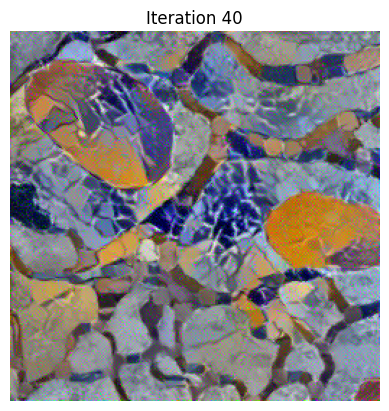

iteration 41
content_loss=70.99897766113281 style_loss=0.02276989445090294
content_loss=70.98165130615234 style_loss=0.022774387151002884
content_loss=70.97889709472656 style_loss=0.022764068096876144
content_loss=70.95767211914062 style_loss=0.02277262881398201
content_loss=70.95674896240234 style_loss=0.022760093212127686
content_loss=70.93470001220703 style_loss=0.02276940643787384
content_loss=70.93211364746094 style_loss=0.02275792881846428
content_loss=70.91817474365234 style_loss=0.022758563980460167
content_loss=70.91226959228516 style_loss=0.022751260548830032
content_loss=70.89547729492188 style_loss=0.02275538444519043
content_loss=70.893798828125 style_loss=0.022743666544556618
content_loss=70.87588500976562 style_loss=0.02274848334491253
content_loss=70.86714935302734 style_loss=0.02274414896965027
content_loss=70.85272216796875 style_loss=0.022745657712221146
content_loss=70.84410858154297 style_loss=0.022741589695215225
content_loss=70.83075714111328 style_loss=0.0227424

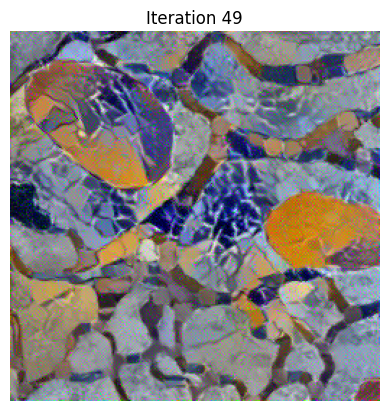

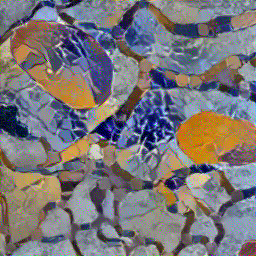

In [11]:
imarray = np.random.rand(256, 256, 3) * 255
image_in = Image.fromarray(imarray.astype("uint8")).convert("RGB")

style_transfer(
    image=image_in,
    content=content,
    style=style,
    content_layers=[model.features[l] for l in [14]],
    style_layers=[model.features[l] for l in [0, 2, 5, 7, 10]],
    lr=1,
    iter_num=50,
    beta=1e3,
)

... and using the content image as a starting point.


iteration 0
content_loss=0.0 style_loss=1.904022216796875
content_loss=2.2325605186779285e-06 style_loss=1.903765082359314
content_loss=50.94092559814453 style_loss=1.2567367553710938
content_loss=71.97655487060547 style_loss=0.8719511032104492
content_loss=98.09221649169922 style_loss=0.6601132154464722
content_loss=103.69855499267578 style_loss=0.5311486124992371
content_loss=116.79043579101562 style_loss=0.4235912263393402
content_loss=139.74037170410156 style_loss=0.3531671464443207
content_loss=134.08770751953125 style_loss=0.3257130980491638
content_loss=137.71868896484375 style_loss=0.29240626096725464
content_loss=144.34251403808594 style_loss=0.2589162290096283
content_loss=149.64431762695312 style_loss=0.2305893450975418
content_loss=162.9725341796875 style_loss=0.20559397339820862
content_loss=162.69424438476562 style_loss=0.19168983399868011
content_loss=167.03045654296875 style_loss=0.1764892190694809
content_loss=169.22381591796875 style_loss=0.16492518782615662
content_l

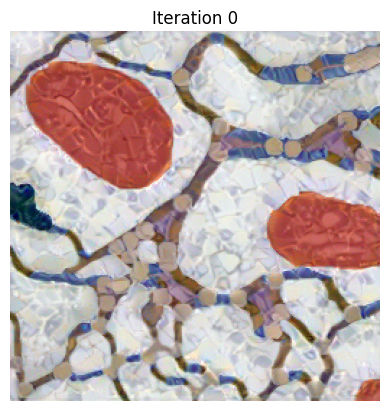

iteration 1
content_loss=189.4711456298828 style_loss=0.12049474567174911
content_loss=194.24871826171875 style_loss=0.11143984645605087
content_loss=195.841064453125 style_loss=0.10694460570812225
content_loss=199.63214111328125 style_loss=0.09895572066307068
content_loss=205.3699493408203 style_loss=0.09298916161060333
content_loss=199.9136962890625 style_loss=0.1039942130446434
content_loss=205.40365600585938 style_loss=0.08947531133890152
content_loss=206.0803985595703 style_loss=0.08808489143848419
content_loss=206.56417846679688 style_loss=0.09276606142520905
content_loss=211.11424255371094 style_loss=0.08054602146148682
content_loss=212.1820068359375 style_loss=0.07852401584386826
content_loss=211.46231079101562 style_loss=0.08502653241157532
content_loss=215.133544921875 style_loss=0.07383900880813599
content_loss=216.05224609375 style_loss=0.07221029698848724
content_loss=215.90660095214844 style_loss=0.08175518363714218
content_loss=219.39942932128906 style_loss=0.06740362197

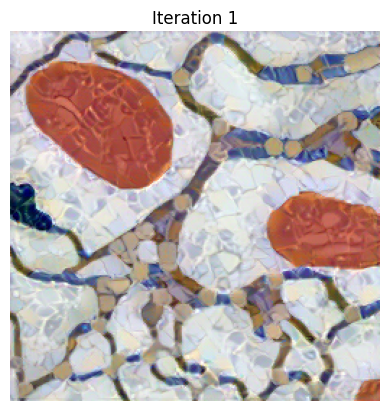

iteration 2
content_loss=224.3782196044922 style_loss=0.06682878732681274
content_loss=226.93862915039062 style_loss=0.05698281526565552
content_loss=227.78627014160156 style_loss=0.05577598884701729
content_loss=226.81625366210938 style_loss=0.0660565048456192
content_loss=230.40786743164062 style_loss=0.052863676100969315
content_loss=231.0115203857422 style_loss=0.05177652835845947
content_loss=232.04913330078125 style_loss=0.05577150732278824
content_loss=232.80572509765625 style_loss=0.04899391531944275
content_loss=233.92694091796875 style_loss=0.04804755374789238
content_loss=230.42872619628906 style_loss=0.0581025592982769
content_loss=235.95730590820312 style_loss=0.04589523747563362
content_loss=236.53163146972656 style_loss=0.04504440352320671
content_loss=235.00616455078125 style_loss=0.04966862127184868
content_loss=237.77639770507812 style_loss=0.042934663593769073
content_loss=238.27545166015625 style_loss=0.04217854514718056
content_loss=236.74595642089844 style_loss=0.

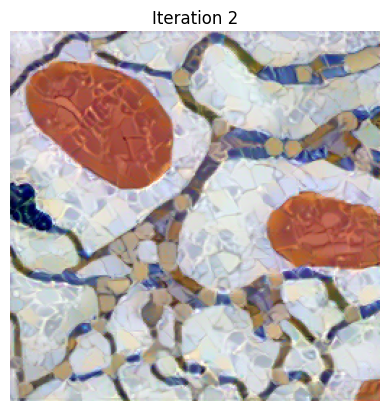

iteration 3
content_loss=241.9660186767578 style_loss=0.037176333367824554
content_loss=239.0772705078125 style_loss=0.04488452523946762
content_loss=243.372314453125 style_loss=0.03569377213716507
content_loss=243.6186981201172 style_loss=0.03508021682500839
content_loss=243.649169921875 style_loss=0.037113357335329056
content_loss=244.38328552246094 style_loss=0.03354519605636597
content_loss=245.13470458984375 style_loss=0.03298351913690567
content_loss=243.02664184570312 style_loss=0.0365668423473835
content_loss=246.40216064453125 style_loss=0.031756509095430374
content_loss=246.71327209472656 style_loss=0.03127729147672653
content_loss=245.3776397705078 style_loss=0.03416059911251068
content_loss=247.5382843017578 style_loss=0.03004700317978859
content_loss=247.9001007080078 style_loss=0.029589593410491943
content_loss=246.78231811523438 style_loss=0.03348398953676224
content_loss=249.08432006835938 style_loss=0.028515005484223366
content_loss=249.38079833984375 style_loss=0.0280

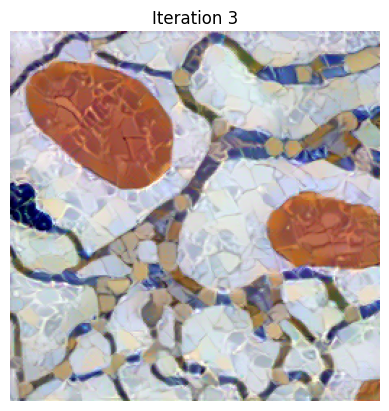

iteration 4
content_loss=251.7074432373047 style_loss=0.025683697313070297
content_loss=251.93617248535156 style_loss=0.02530820667743683
content_loss=252.06094360351562 style_loss=0.026859724894165993
content_loss=252.95394897460938 style_loss=0.024353938177227974
content_loss=253.21066284179688 style_loss=0.024010485038161278
content_loss=253.1373291015625 style_loss=0.026486683636903763
content_loss=254.38539123535156 style_loss=0.023137306794524193
content_loss=254.32810974121094 style_loss=0.02281172387301922
content_loss=254.56463623046875 style_loss=0.022867100313305855
content_loss=255.24652099609375 style_loss=0.021961411461234093
content_loss=255.3651580810547 style_loss=0.021702537313103676
content_loss=254.82077026367188 style_loss=0.021902071312069893
content_loss=256.5772705078125 style_loss=0.020771492272615433
content_loss=256.4266052246094 style_loss=0.020526912063360214
content_loss=255.16525268554688 style_loss=0.020954331383109093
content_loss=256.71478271484375 sty

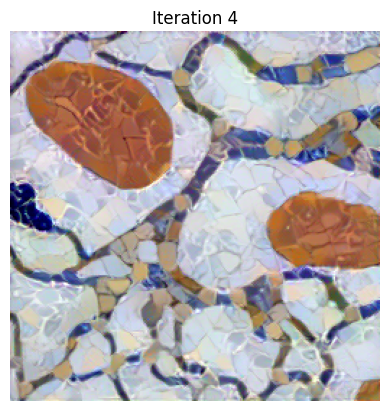

iteration 5
content_loss=256.2228698730469 style_loss=0.019999723881483078
content_loss=257.9524230957031 style_loss=0.0184529609978199
content_loss=258.1043701171875 style_loss=0.01823445037007332
content_loss=256.5398864746094 style_loss=0.019554389640688896
content_loss=258.6925964355469 style_loss=0.01772405579686165
content_loss=258.75457763671875 style_loss=0.01751590333878994
content_loss=258.0570068359375 style_loss=0.018424948677420616
content_loss=259.15338134765625 style_loss=0.01702294871211052
content_loss=259.3608093261719 style_loss=0.016831742599606514
content_loss=257.0330810546875 style_loss=0.019486647099256516
content_loss=259.931640625 style_loss=0.016425300389528275
content_loss=260.04229736328125 style_loss=0.01624143496155739
content_loss=258.6075744628906 style_loss=0.017213288694620132
content_loss=260.2140197753906 style_loss=0.01580478623509407
content_loss=260.3810119628906 style_loss=0.015630265697836876
content_loss=257.8196716308594 style_loss=0.01797184

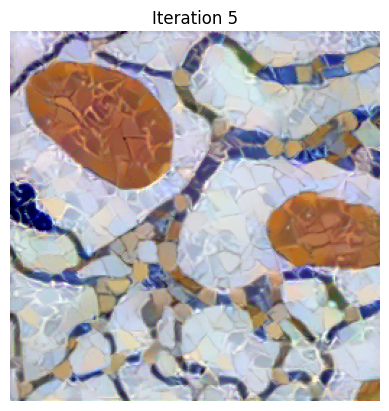

iteration 6
content_loss=261.01031494140625 style_loss=0.014630538411438465
content_loss=259.4020690917969 style_loss=0.015620509162545204
content_loss=261.27642822265625 style_loss=0.014304215088486671
content_loss=261.3140869140625 style_loss=0.014166979119181633
content_loss=259.64434814453125 style_loss=0.014897508546710014
content_loss=261.46331787109375 style_loss=0.01385894138365984
content_loss=261.4476013183594 style_loss=0.013734109699726105
content_loss=259.7555847167969 style_loss=0.014590415172278881
content_loss=261.60107421875 style_loss=0.013427548110485077
content_loss=261.5548095703125 style_loss=0.013305005617439747
content_loss=259.67626953125 style_loss=0.0140228271484375
content_loss=261.6007995605469 style_loss=0.013006548397243023
content_loss=261.536376953125 style_loss=0.012890763580799103
content_loss=259.8050537109375 style_loss=0.013729318976402283
content_loss=261.6786193847656 style_loss=0.012630271725356579
content_loss=261.6144104003906 style_loss=0.012

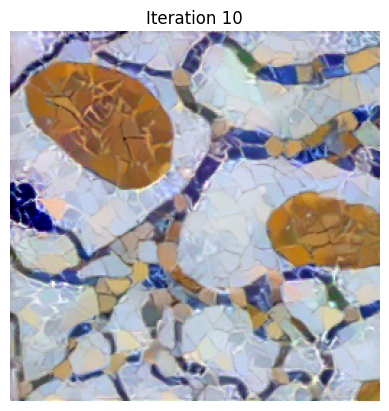

iteration 11
content_loss=260.071044921875 style_loss=0.007145889103412628
content_loss=260.96807861328125 style_loss=0.0069752647541463375
content_loss=260.9142150878906 style_loss=0.006945297122001648
content_loss=259.4087829589844 style_loss=0.007230920251458883
content_loss=260.90496826171875 style_loss=0.006868506781756878
content_loss=260.8459777832031 style_loss=0.006837165914475918
content_loss=259.75848388671875 style_loss=0.006954187992960215
content_loss=260.77410888671875 style_loss=0.006761130876839161
content_loss=260.7344665527344 style_loss=0.006731988396495581
content_loss=259.7491760253906 style_loss=0.0069019244983792305
content_loss=260.7624816894531 style_loss=0.006661850027740002
content_loss=260.7375183105469 style_loss=0.006634152494370937
content_loss=259.9320373535156 style_loss=0.006766823120415211
content_loss=260.7344665527344 style_loss=0.006561567075550556
content_loss=260.71759033203125 style_loss=0.006534369196742773
content_loss=259.6012878417969 style

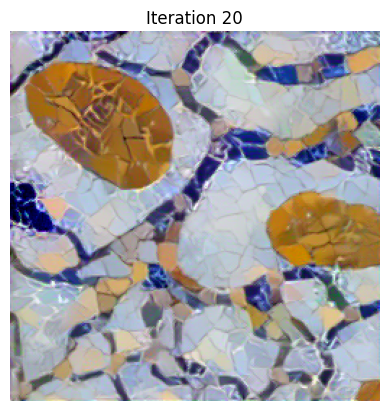

iteration 21
content_loss=250.24635314941406 style_loss=0.0031386432237923145
content_loss=249.57443237304688 style_loss=0.0031549856066703796
content_loss=250.07583618164062 style_loss=0.003115437924861908
content_loss=250.0135498046875 style_loss=0.0031081277411431074
content_loss=249.2731475830078 style_loss=0.003164745168760419
content_loss=249.9317626953125 style_loss=0.003086571581661701
content_loss=249.8689422607422 style_loss=0.003078716341406107
content_loss=249.2184600830078 style_loss=0.0030996582936495543
content_loss=249.7323455810547 style_loss=0.0030591583345085382
content_loss=249.66725158691406 style_loss=0.003052456770092249
content_loss=249.0276336669922 style_loss=0.003075673710554838
content_loss=249.5391082763672 style_loss=0.003032086417078972
content_loss=249.47119140625 style_loss=0.003025271464139223
content_loss=248.6893310546875 style_loss=0.0030556677374988794
content_loss=249.31875610351562 style_loss=0.00300319935195148
content_loss=249.23484802246094 st

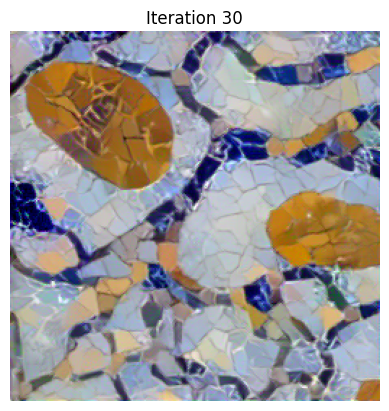

iteration 31
content_loss=235.7584228515625 style_loss=0.0017327743116766214
content_loss=235.67115783691406 style_loss=0.0017280252650380135
content_loss=235.59039306640625 style_loss=0.0017267484217882156
content_loss=235.52638244628906 style_loss=0.0017245651688426733
content_loss=235.45819091796875 style_loss=0.001719917170703411
content_loss=235.3391876220703 style_loss=0.0017120391130447388
content_loss=235.23751831054688 style_loss=0.0017067274311557412
content_loss=235.3212890625 style_loss=0.0016996717313304543
content_loss=235.15240478515625 style_loss=0.001699294545687735
content_loss=235.22227478027344 style_loss=0.0016953336307778955
content_loss=235.20596313476562 style_loss=0.0016930114943534136
content_loss=235.09027099609375 style_loss=0.001688624732196331
content_loss=234.9727325439453 style_loss=0.001683444483205676
content_loss=234.87979125976562 style_loss=0.0016768978675827384
content_loss=234.7779541015625 style_loss=0.001671727979555726
content_loss=234.75891113

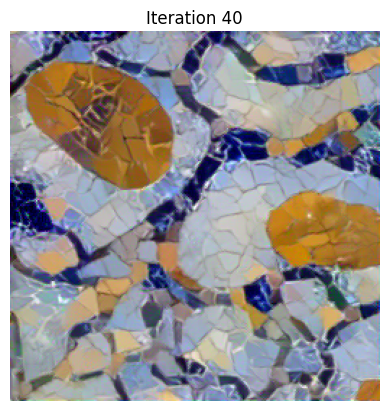

iteration 41
content_loss=225.1449737548828 style_loss=0.0011811607982963324
content_loss=225.08413696289062 style_loss=0.0011793164303526282
content_loss=225.017822265625 style_loss=0.00117695820517838
content_loss=224.8760528564453 style_loss=0.0011756696039810777
content_loss=224.971435546875 style_loss=0.0011719949543476105
content_loss=224.92410278320312 style_loss=0.0011713721323758364
content_loss=224.92237854003906 style_loss=0.0011701431358233094
content_loss=224.8671875 style_loss=0.0011684929486364126
content_loss=224.7993621826172 style_loss=0.0011662757024168968
content_loss=224.66639709472656 style_loss=0.001165389665402472
content_loss=224.70877075195312 style_loss=0.001163233770057559
content_loss=224.6304931640625 style_loss=0.0011626479681581259
content_loss=224.61233520507812 style_loss=0.0011618409771472216
content_loss=224.51553344726562 style_loss=0.0011597595876082778
content_loss=224.56163024902344 style_loss=0.0011572043877094984
content_loss=224.49456787109375

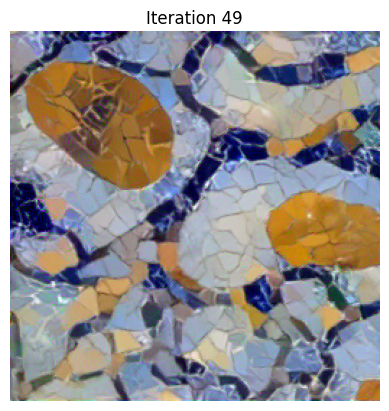

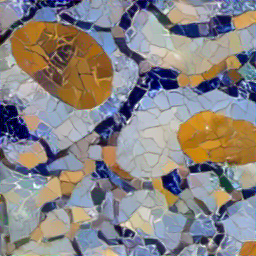

In [12]:
imarray = np.random.rand(256, 256, 3) * 255
image_in = Image.fromarray(imarray.astype("uint8")).convert("RGB")

style_transfer(
    image=content,
    content=content,
    style=style,
    content_layers=[model.features[l] for l in [14]],
    style_layers=[model.features[l] for l in [0, 2, 5, 7, 10]],
    lr=1,
    iter_num=50,
    beta=1e5,
)